In [2]:
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt

def create_mask(width, height, segmentation):
    mask = np.zeros((height, width), dtype=np.uint8)
    for polygon in segmentation:
        polygon = np.array(polygon, dtype=np.int32).reshape((-1, 1, 2))
        cv2.fillPoly(mask, [polygon], 1)
    return mask

def show_mask(mask):
    plt.imshow(mask, cmap='gray')
    plt.show()

# Load the annotations file
with open('/content/drive/MyDrive/selvet.v1i.coco-segmentation/train/_annotations.coco.json', 'r') as file:
    annotations = json.load(file)

# Loop through each annotation and create a mask
for annotation in annotations['annotations']:
    image_data = next(image for image in annotations['images'] if image['id'] == annotation['image_id'])
    width, height = image_data['width'], image_data['height']
    segmentation = annotation['segmentation']

    # Create the mask
    mask = create_mask(width, height, segmentation)

    # Show the mask
    show_mask(mask)

    # Save the mask to a file, using the image file name as a base
    mask_filename = image_data['file_name'].replace('.jpg', '_mask.png')
    cv2.imwrite(mask_filename, mask * 255)  # Multiply by 255 to convert from 0-1 to 0-255




ImportError: DLL load failed while importing _cext: The specified module could not be found.

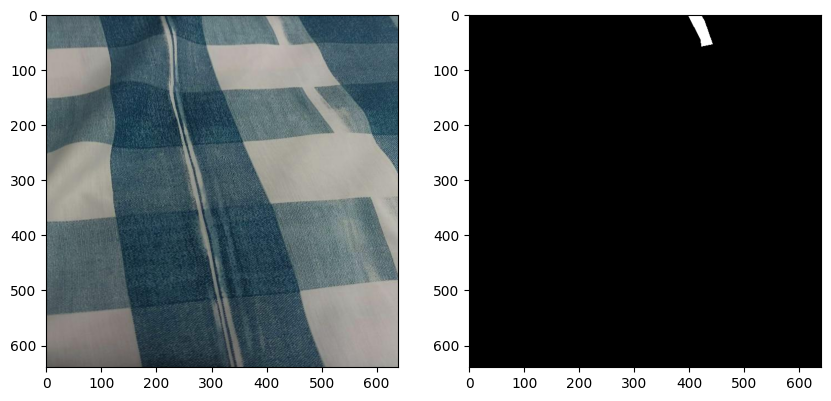

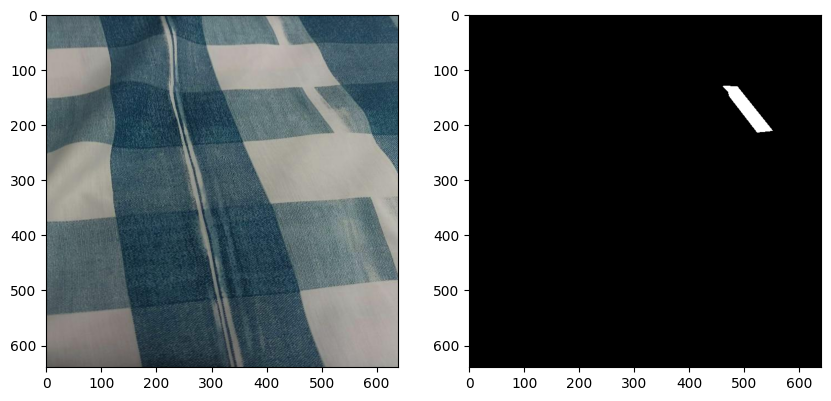

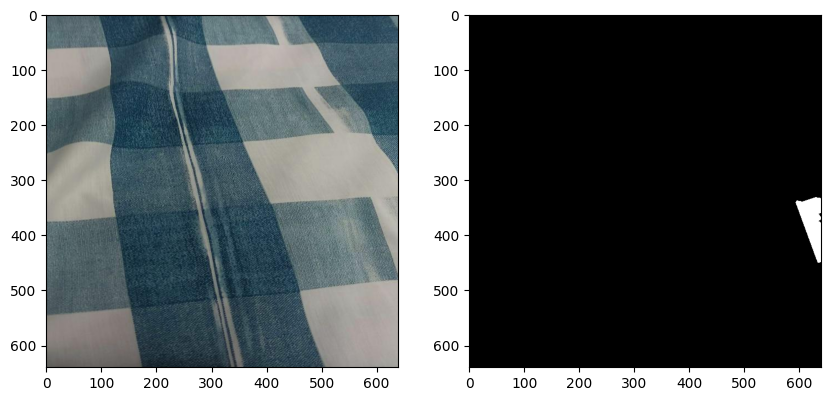

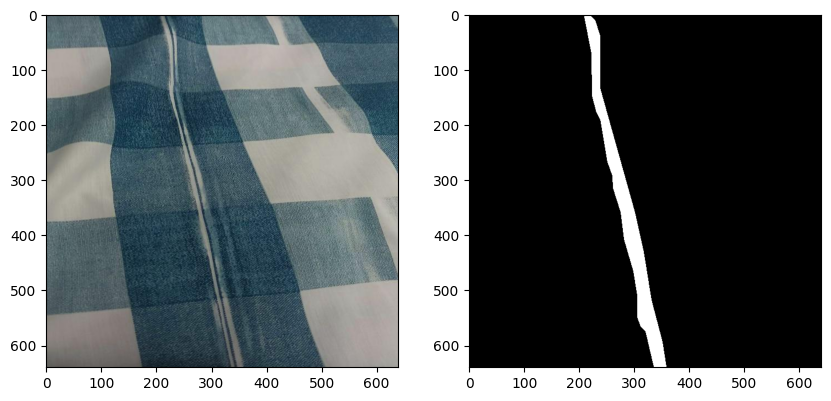

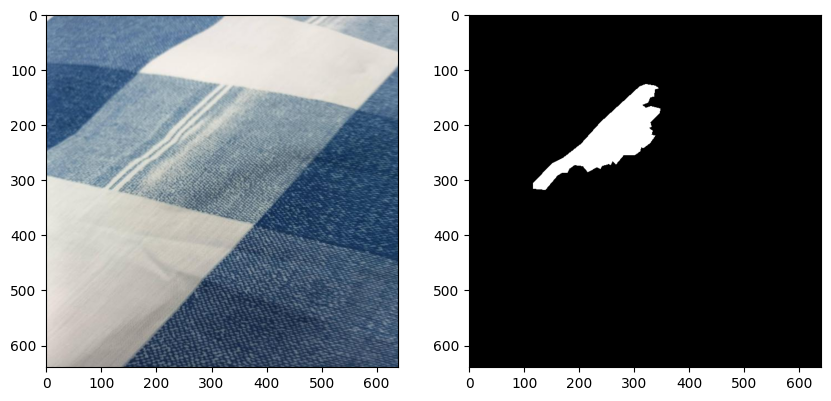

...

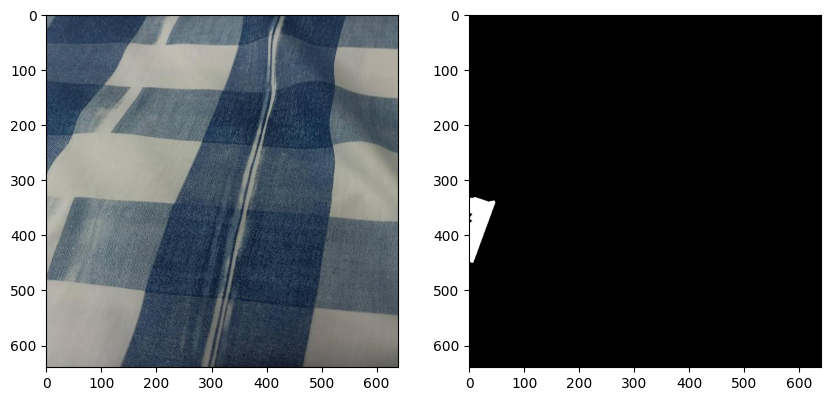

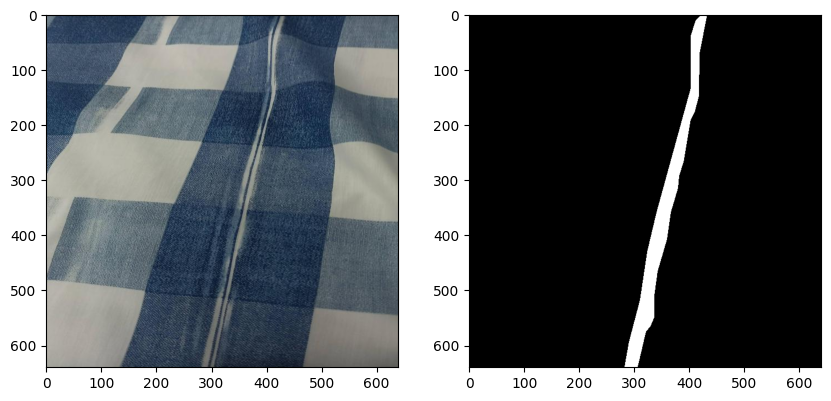

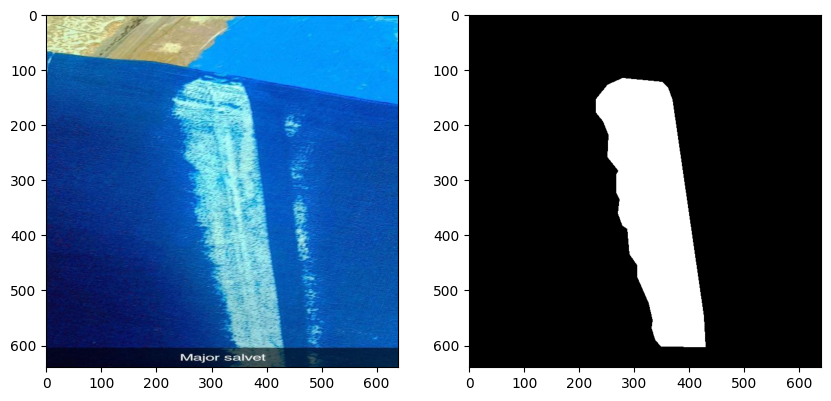

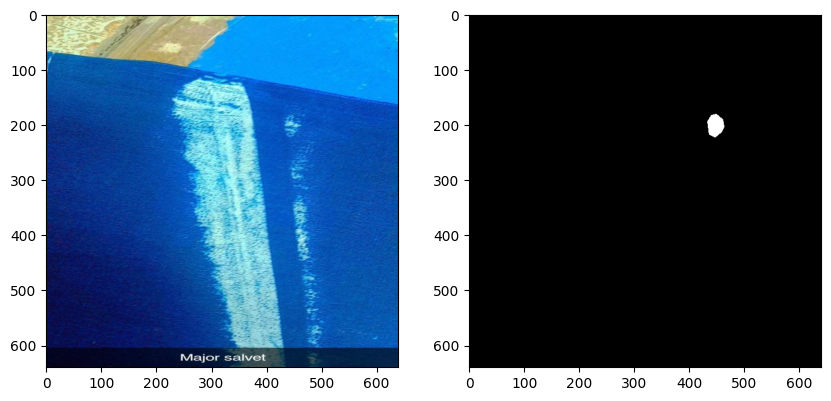

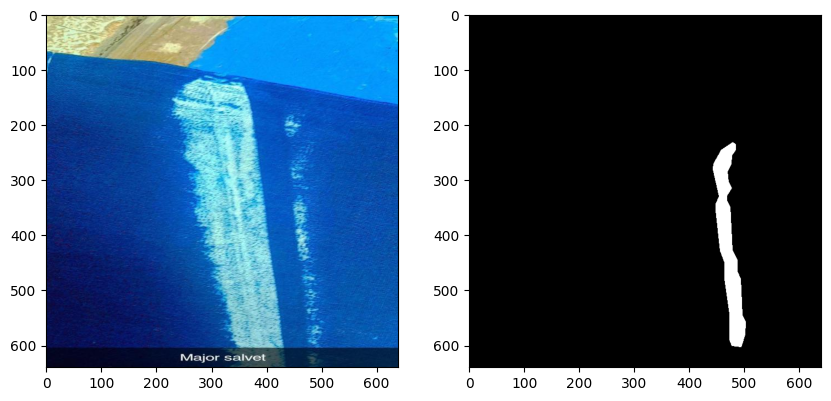

In [ ]:
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt

def create_mask(width, height, segmentation):
    mask = np.zeros((height, width), dtype=np.uint8)
    for polygon in segmentation:
        polygon = np.array(polygon, dtype=np.int32).reshape((-1, 1, 2))
        cv2.fillPoly(mask, [polygon], 1)
    return mask

def show_images(image, mask):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.show()

image_path = '/content/drive/MyDrive/selvet.v1i.coco-segmentation/train/Images/'

# Load the annotations file
with open('/content/drive/MyDrive/selvet.v1i.coco-segmentation/train/_annotations.coco.json', 'r') as file:
    annotations = json.load(file)

# Loop through each annotation and create a mask
for annotation in annotations['annotations']:
    image_data = next(image for image in annotations['images'] if image['id'] == annotation['image_id'])
    width, height = image_data['width'], image_data['height']
    segmentation = annotation['segmentation']

    # Create the mask
    mask = create_mask(width, height, segmentation)

    # Load the actual image
    img_filename = image_path + image_data['file_name']
    original_image = cv2.imread(img_filename)

    # Handle the case when the image is not found
    if original_image is None:
        print(f"Image not found: {img_filename}")
        continue

    # Show the original image and the mask side by side
    show_images(original_image, mask)


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate

def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)

    up8 = concatenate([UpSampling2D(size=(2, 2))(conv3), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    return Model(inputs=inputs, outputs=conv10)

In [ ]:
# Compile the model
model = unet()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
import os
import numpy as np
import cv2

def load_images_and_masks(annotations, image_path, target_size=(256, 256)):
    images = []
    masks = []
    for annotation in annotations['annotations']:
        image_data = next(image for image in annotations['images'] if image['id'] == annotation['image_id'])
        segmentation = annotation['segmentation']
        width, height = image_data['width'], image_data['height']

        # Create the mask
        mask = create_mask(width, height, segmentation)

        # Load the actual image
        img_filename = os.path.join(image_path, image_data['file_name'])
        original_image = cv2.imread(img_filename)

        if original_image is None:
            print(f"Image not found: {img_filename}")
            continue

        # Resize images and masks
        original_image = cv2.resize(original_image, target_size)
        mask = cv2.resize(mask, target_size)

        # Normalize images and masks
        original_image = original_image / 255.0
        mask = mask[..., np.newaxis]  # Add a channel dimension

        images.append(original_image)
        masks.append(mask)

    return np.array(images), np.array(masks)

image_path = '/content/drive/MyDrive/selvet.v1i.coco-segmentation/train/Images'

# Load images and masks for training
X_train, Y_train = load_images_and_masks(annotations, image_path)

# Train the model
history = model.fit(X_train, Y_train, batch_size=16, epochs=10)

# Evaluate the model on the overall validation set
loss, accuracy = model.evaluate(X_train, Y_train)
print(f"overall Loss: {loss:.4f}")
print(f"overall Accuracy: {accuracy:.4f}")


Epoch 1/10
3/3 [==============================] - 39s 11s/step - loss: 0.5572 - accuracy: 0.7102
Epoch 2/10
3/3 [==============================] - 31s 9s/step - loss: 0.2229 - accuracy: 0.9693
Epoch 3/10
3/3 [==============================] - 32s 9s/step - loss: 0.2876 - accuracy: 0.9693
Epoch 4/10
3/3 [==============================] - 31s 9s/step - loss: 0.2182 - accuracy: 0.9693
Epoch 5/10
3/3 [==============================] - 31s 9s/step - loss: 0.2030 - accuracy: 0.9693
Epoch 6/10
3/3 [==============================] - 31s 9s/step - loss: 0.2006 - accuracy: 0.9693
Epoch 7/10
3/3 [==============================] - 31s 9s/step - loss: 0.1877 - accuracy: 0.9693
Epoch 8/10
3/3 [==============================] - 34s 10s/step - loss: 0.1816 - accuracy: 0.9693
Epoch 9/10
3/3 [==============================] - 33s 9s/step - loss: 0.1770 - accuracy: 0.9693
Epoch 10/10
2/2 [==============================] - 10s 809ms/step - loss: 0.1659 - accuracy: 0.9693
Training Loss: 0.1659
Training Acc